# Segment Anything Model 2

실습 목표
1. SAM2 모델에 클릭으로 좌표 프롬프트를 입력하여 결과 확인하기
2. SAM2 모델의 영상 내 객체 segmentation & tracking 결과 확인하기

# 단일 이미지 마스크 생성

## Settings

In [12]:
import os, cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [13]:
device = torch.device("cpu")
sam2_checkpoint = "../checkpoints/sam2.1_hiera_small.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_s.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

## Basic Functions

In [99]:
# 공식 github에서 발췌한 함수들

np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Inputs

### Image

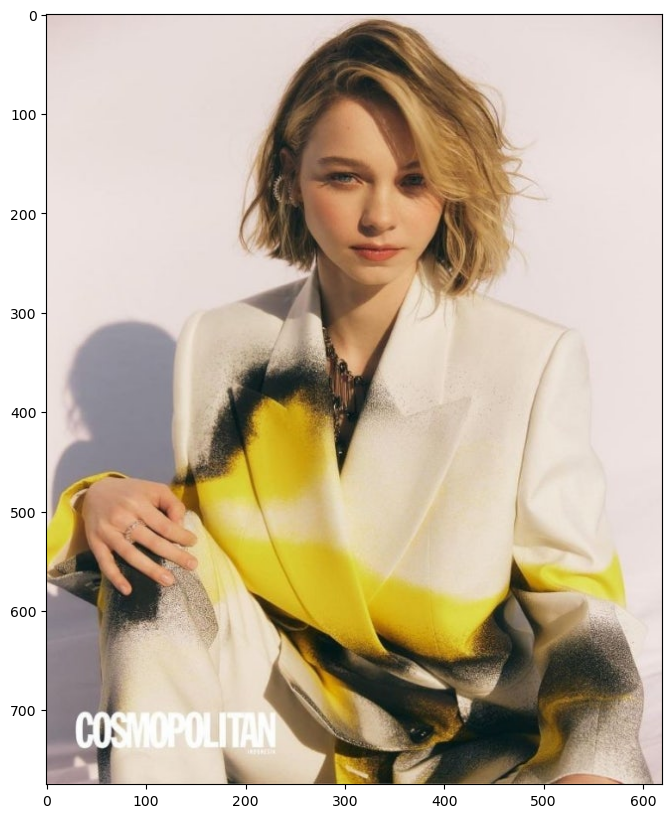

In [82]:
image = cv2.cvtColor(cv2.imread('images/emma_fr.png'), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.show()

In [83]:
predictor.set_image(image)

### Points(마우스 입력)

In [133]:
# 마우스 클릭을 통한 포인트 입력을 위한 함수

def mouse_callback(event, x, y, flags, param):
    global clicked_points

    if event == cv2.EVENT_LBUTTONDOWN:
        print(f'클릭된 좌표: ({x}, {y})')
        clicked_points.append((x,y))

        img = cv2.cvtColor(image, cv2.COLOR_RGB2BGR).copy()

        # 클릭 위치에 표시
        cv2.circle(img, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Click on Image', img)

def click_points(image):
    cv2.namedWindow("Click on Image")
    cv2.setMouseCallback('Click on Image', mouse_callback)

    cv2.imshow("Click on Image", cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    while True:
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cv2.destroyAllWindows()

    print("모든 클릭된 좌표:", clicked_points)

In [94]:
clicked_points = []
click_points(image)

클릭된 좌표: (402, 81)
모든 클릭된 좌표: [(402, 81)]


In [95]:
input_point = np.array(clicked_points)
input_label = np.array([1]*len(input_point))

- 입력된 좌표 확인

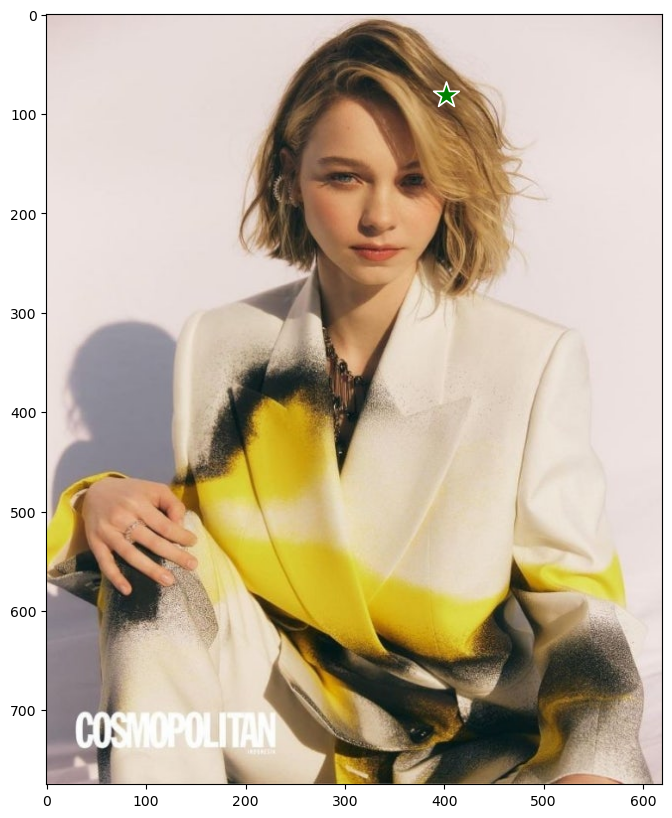

In [96]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

## Outputs

In [97]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

In [103]:
masks.shape

(3, 775, 620)

- 논문에서 봤던대로 3개의 마스크를 출력한다

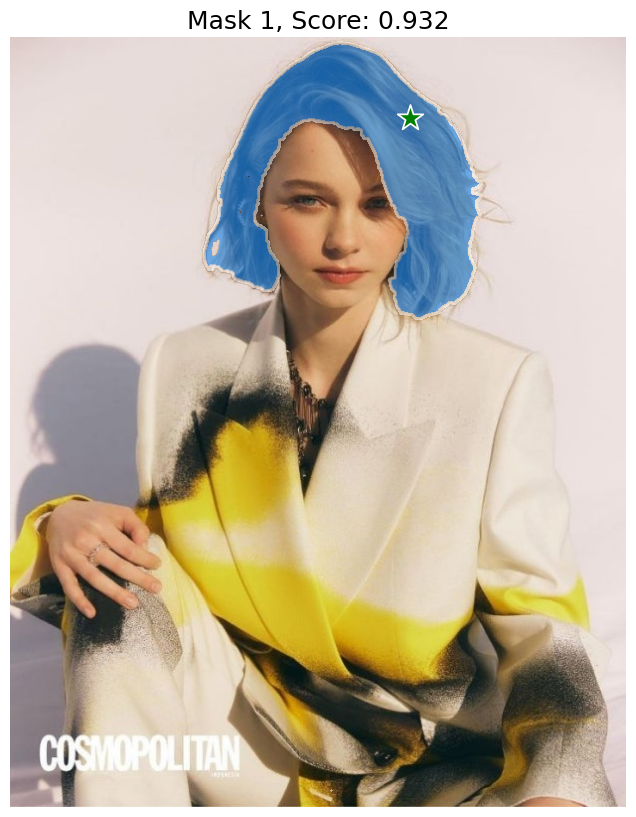

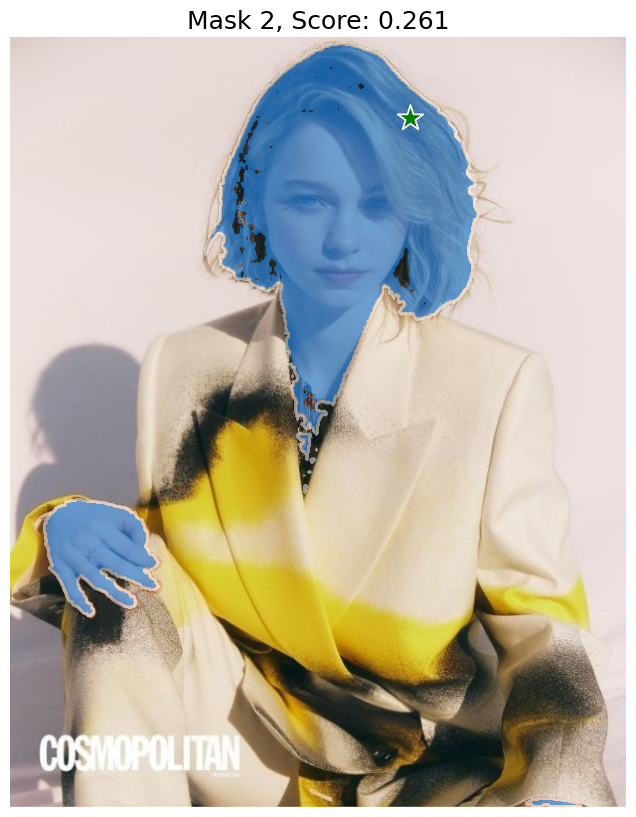

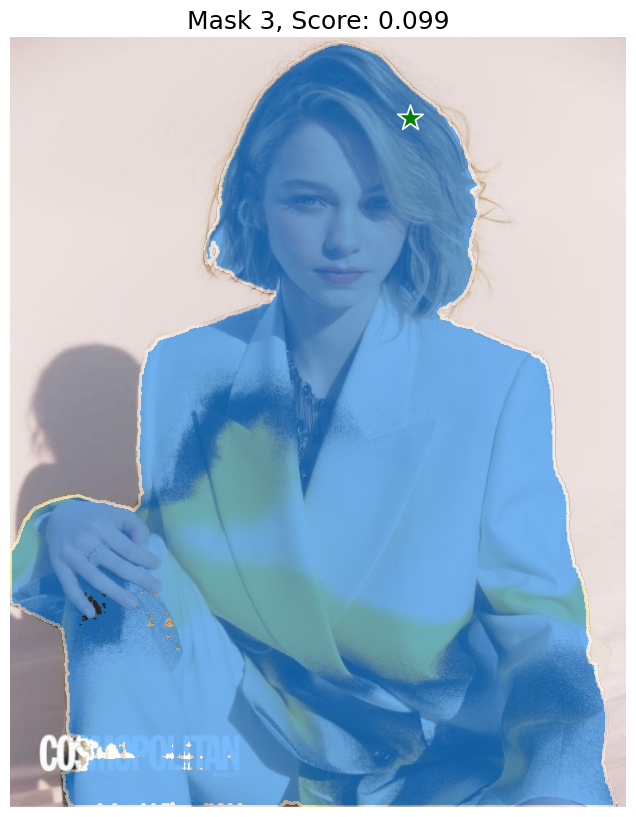

In [98]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

- 3개의 마스크 Mask 1, Mask 2, Mask 3은 각각 Sub-Part, Part, Whole에 해당한다.
- Part 마스크에서 옷을 제외한 사람의 신체 부위 마스크 생성을 했다.
    - 노출된 신체 부위가 적고, 특히 왼손에 경우 거의 보이지 않음에도 불구하고 일부 영역이라도 마스킹을 해낸 것은 모델이 소매(옷)와 신체를 잘 구분하고 있음을 증명한다.
    - 머리카락 내부에서 마스크가 일부 빈 부분은 이해가 잘 되지 않지만, 머리카락 색상이 고르지 않아 발생하는 문제가 아닐까 추측된다.
    - 흉부에 시스루 의상으로 인해 마스크가 명확하게 생성되지 않았다. 머리카락에서와 유사한 현상으로 예상된다.
- Whole 마스크에서 완벽하지는 않았지만 정강이 부위에 글씨를 옷과는 별개로 구분하려고 한 흔적이 보인다. 
    - 옷의 무늬인지 사진에 덧붙여진 글씨인지 어느 정도 다리 윤곽을 통해 구분해내는 것 같다.
- Sub-Part 마스크에서 일부 돌출된 잔머리카락을 제외하고 꽤나 잘 분리해냈다. 
    - 점수 역시 0.932로 매우 높게 예측 결과를 냈다.
    - 이미의 그림자와 앞머리는 잘 구분했으나 귀와 주변 머리카락색이 함께 어두운 색상이어서 인지 귀를 따로 구분해내지 못했다.
    - 혹시 머리카락에 점을 하나 더 찍으면 귀를 구분해낼 수 있는지 확인해보자.

## Multi-Points Inference

In [115]:
def Seg_on_Image(image, multimask=False):
    predictor.set_image(image)
    click_points(image)

    input_point = np.array(clicked_points)
    input_label = np.array([1]*len(input_point))

    # mask_input = logits[np.argmax(scores), :, :]

    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=False,
    )
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    logits = logits[sorted_ind]

    show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

클릭된 좌표: (258, 81)
클릭된 좌표: (406, 99)
모든 클릭된 좌표: [(258, 81), (406, 99)]


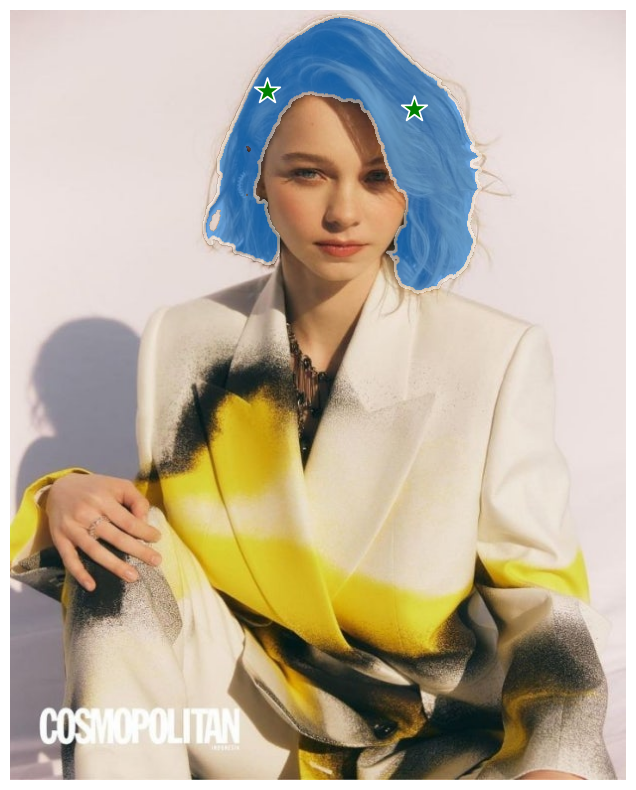

In [112]:
clicked_points = []
Seg_on_Image(image)

- 머리카락에 점 2개를 찍어도 귀를 구분하여 마스크를 생성하지는 않았다.

---

# 동영상 마스크 생성

- SAM2의 가장 두드러지는 특징은 동영상에서 단일 프레임에 대한 프롬프트 입력으로 전체 영상에서 해당 부분을 Tracking하며 segmentation을 진행한다는 점이다.

## Settings

In [118]:
from sam2.build_sam import build_sam2_video_predictor

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [148]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

## Inputs

### Video

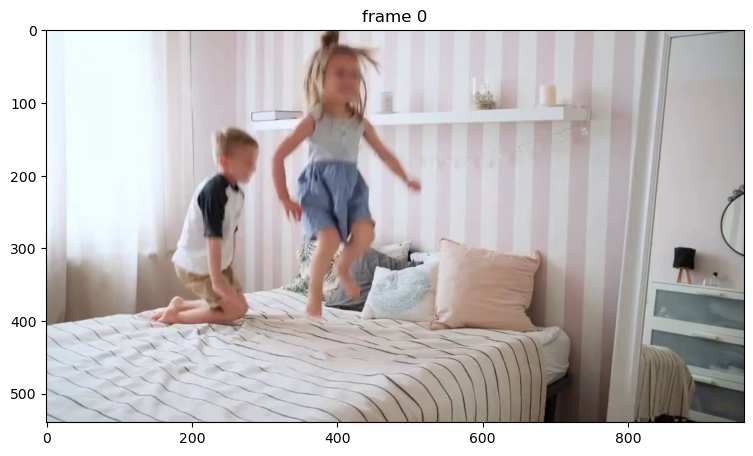

In [126]:
video_path = "./videos/bedroom.mp4"
cap = cv2.VideoCapture(video_path)
frames = []
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
cap.release()

# 첫 프레임 확인
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.fromarray(frames[frame_idx]))

In [136]:
inference_state = predictor.init_state(video_path)  # 영상을 이해하는 과정

In [137]:
predictor.reset_state(inference_state)  # 반복 작업으로 내부적으로 꼬이지 않게 리셋해주는 작업이 필요하다고 한다. predictor 첫 사용시에는 불필요한 작업.

### Prompts

In [134]:
clicked_points = []
image = frames[frame_idx]
click_points(image)

클릭된 좌표: (214, 356)
클릭된 좌표: (265, 190)
클릭된 좌표: (231, 247)
모든 클릭된 좌표: [(214, 356), (265, 190), (231, 247)]


In [145]:
ann_frame_idx = 0 
ann_obj_id = 1 

points = np.array(clicked_points, dtype=np.float32)
labels = np.array([1]*len(points), np.int32)

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

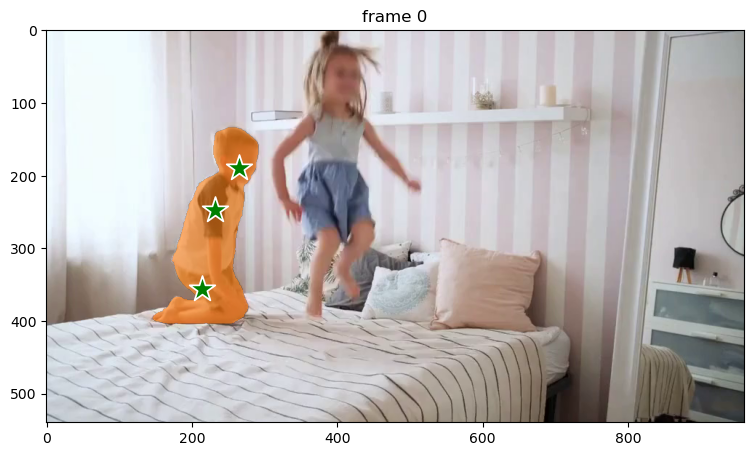

In [149]:
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.fromarray(frames[ann_frame_idx]))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

- 남자 아이 전신에 대한 마스킹이 3개의 점으로 잘 생성되었다.

## Inference

propagate in video: 100%|██████████| 200/200 [05:57<00:00,  1.79s/it]


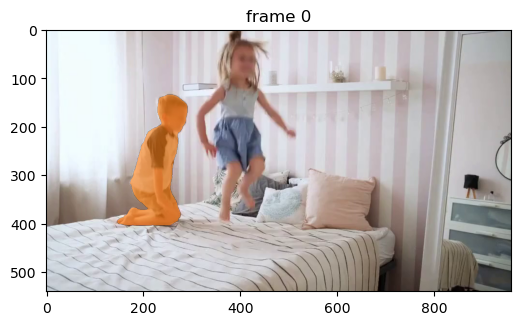

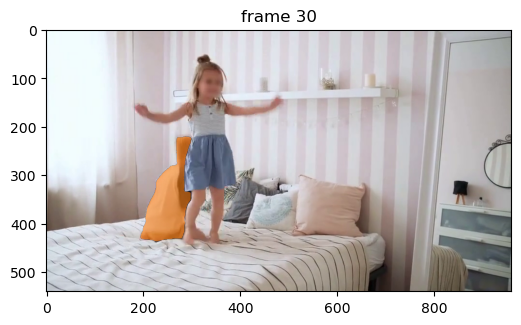

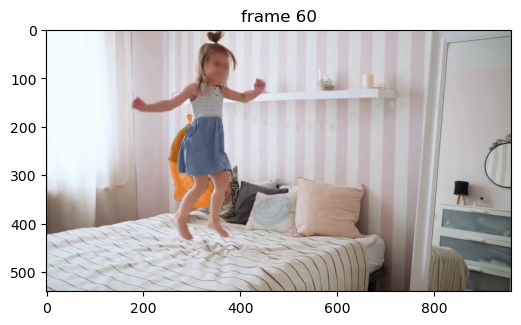

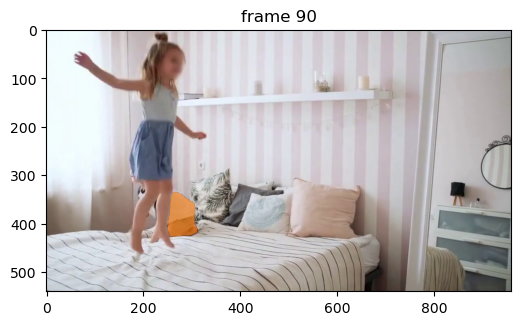

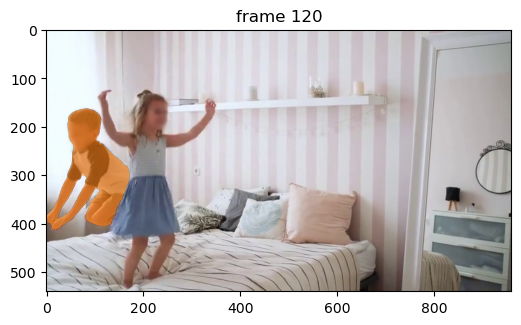

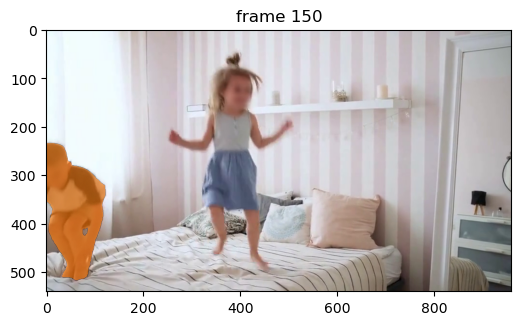

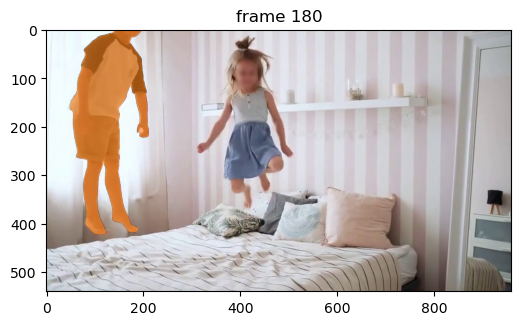

In [150]:
# 영상 전체에 순전파를 통한 마스크 생성
video_segments = {}  # 프레임별 segmentation 결과
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# 특정 프레임마다 결과 출력
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frames), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.fromarray(frames[out_frame_idx]))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

- 프레임이 진행됨에 따라 여자아이와 겹치고 남자아이의 자세로 인해 형상이 거의 사라졌다가 돌아왔지만 잘 구분해내며 Tracking segmentation을 수행해냈다.
- 남자아이와 여자아이가 뚜렷하게 구분되는 특징이 있고 남자아이가 완전히 사라지지는 않았었다. 만약 유사한 특징을 가진 여러 인물들 사이에서 겹쳐지며 완전히 사라지는 경우에도 모델이 Tracking을 잘 수행해낼 수 있는지 확인해보자.

---

In [166]:
video_path = "./videos/dirty_work.mp4"
cap = cv2.VideoCapture(video_path)
frames = []
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
cap.release()

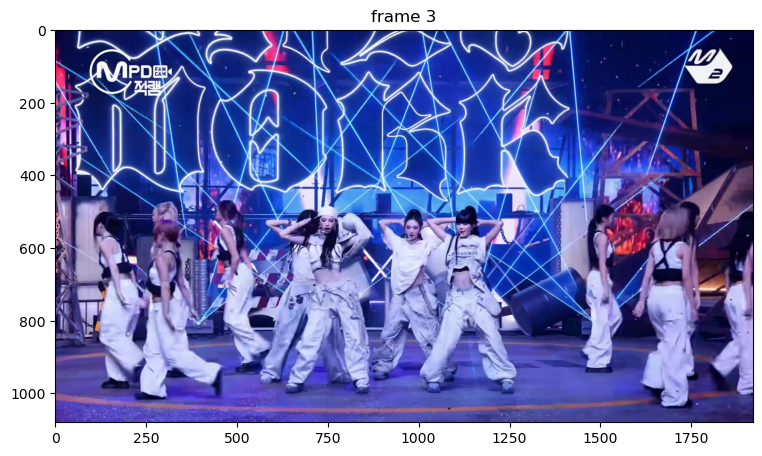

In [167]:
# 프레임 확인
frame_idx = 3
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.fromarray(frames[frame_idx]))

- 추가로 시작 프레임이 아니라 중간 프레임에서 프롬프트를 입력 시 이전 프레임에도 적용이 되는지 확인해본다.
    - 여기서는 3번째 프레임에서 프롬프트를 주입했다.

In [168]:
inference_state = predictor.init_state(video_path)
predictor.reset_state(inference_state)

In [169]:
clicked_points = []
image = frames[frame_idx]
click_points(image)

클릭된 좌표: (1136, 520)
클릭된 좌표: (1121, 606)
클릭된 좌표: (1213, 553)
클릭된 좌표: (1053, 551)
클릭된 좌표: (1119, 696)
클릭된 좌표: (1066, 875)
클릭된 좌표: (1212, 864)
클릭된 좌표: (1193, 756)
모든 클릭된 좌표: [(1136, 520), (1121, 606), (1213, 553), (1053, 551), (1119, 696), (1066, 875), (1212, 864), (1193, 756)]


In [170]:
ann_frame_idx = frame_idx
ann_obj_id = 1 

points = np.array(clicked_points, dtype=np.float32)
labels = np.array([1]*len(points), np.int32)

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

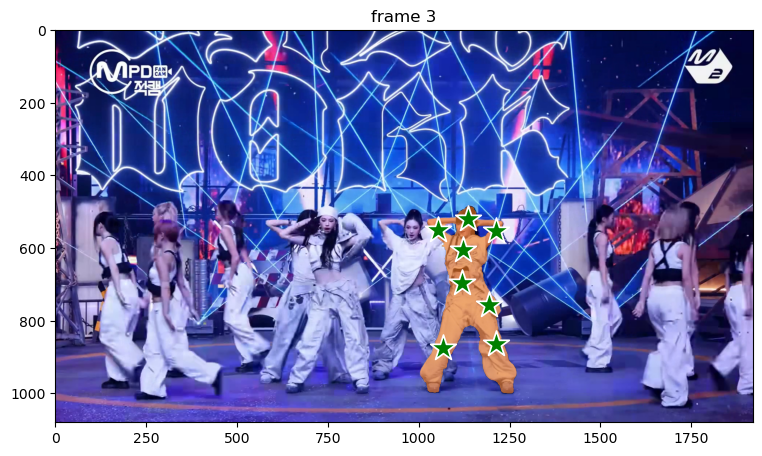

In [171]:
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.fromarray(frames[ann_frame_idx]))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

- 일단 단일 프레임에서 다른 사람과 겹쳐지는 신체부위 같은 색상의 바지가 겹치는 부분은 잘 구별해냈다.

In [172]:
# 영상 전체에 순전파를 통한 마스크 생성
video_segments = {}  # 프레임별 segmentation 결과
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 47/47 [01:21<00:00,  1.74s/it]


KeyError: 0

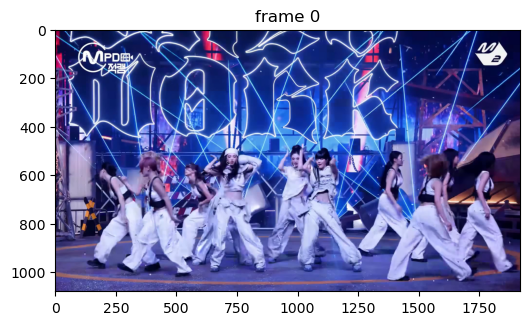

In [174]:
# 특정 프레임마다 결과 출력
vis_frame_stride = 5
plt.close("all")
for out_frame_idx in range(0, len(frames), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.fromarray(frames[out_frame_idx]))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

- 3번 프레임에서 프롬프트가 입력되어 0번 프레임부터 마스크를 생성하는 것은 적용되지 않는 것으로 확인됐다.
    - 코드의 내부 로직에 의한 것으로 조금만 손보면 이전 프레임에도 적용할 수 있을 것 같다.

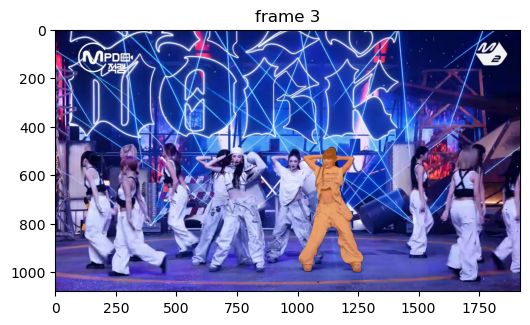

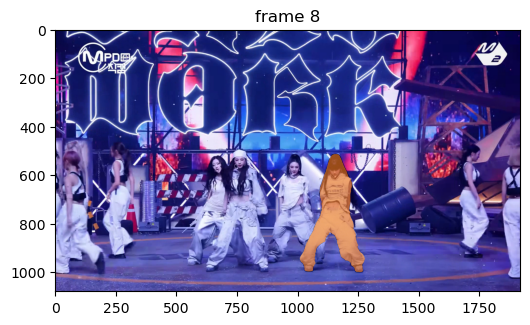

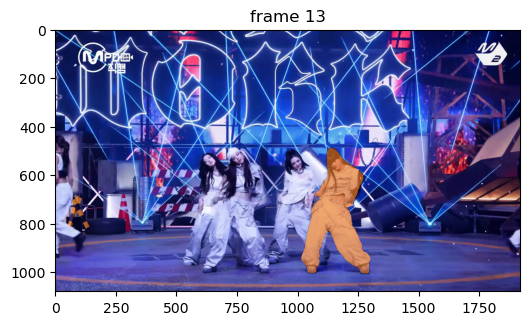

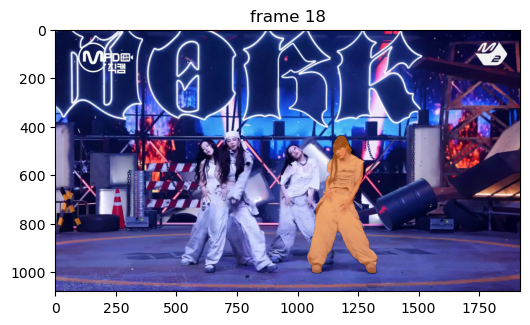

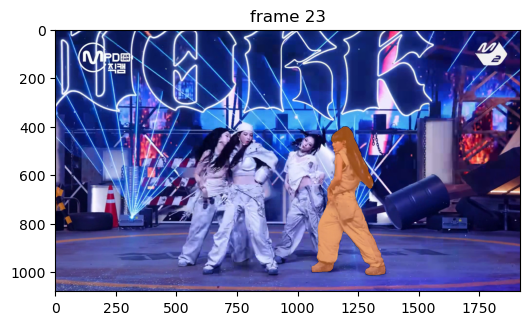

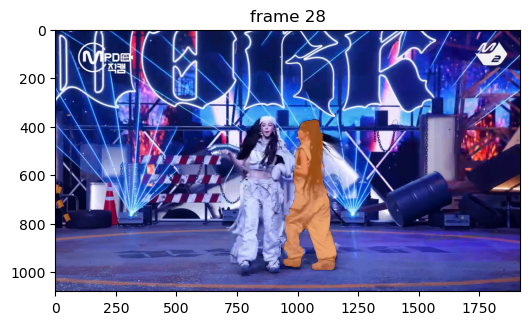

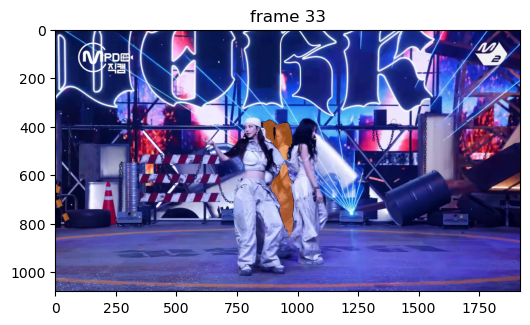

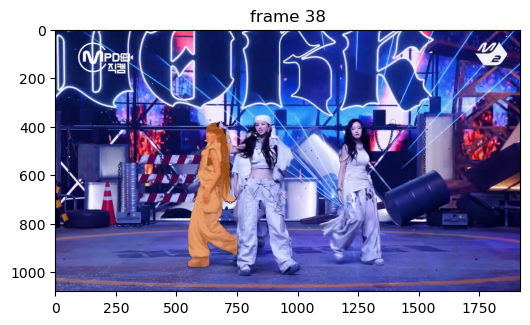

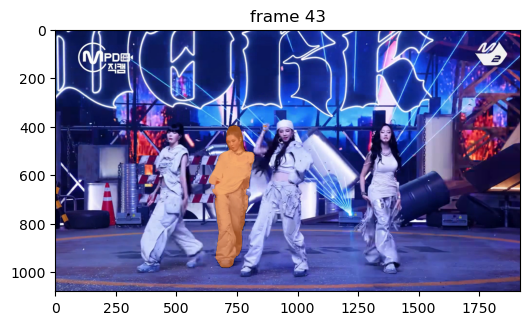

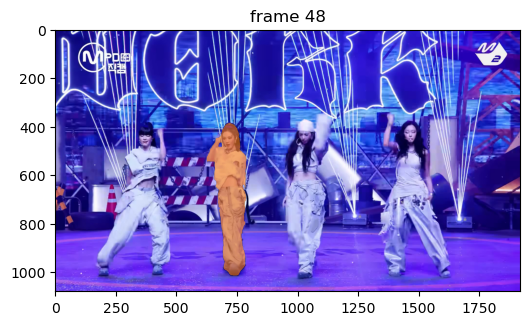

In [175]:
# 특정 프레임마다 결과 출력
vis_frame_stride = 5
plt.close("all")
for out_frame_idx in range(3, len(frames), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.fromarray(frames[out_frame_idx]))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

- 겹쳐지기 직전까지 마스크가 매우 적절하게 생성되었다.
- 33번 프레임에서 4명이 동시에 겹쳐지는 순간 2명의 머리가 마스크 안으로 들어왔다.
- 38번 프레임에서 다시 인물들이 흩어질때, 분리 대상(윈터)을 잘 구분해냈으나 뒤이어 43번 프레임에서 해당 위치에 등장한 다른 대상(닝닝)에게 마스크가 옮겨갔다.

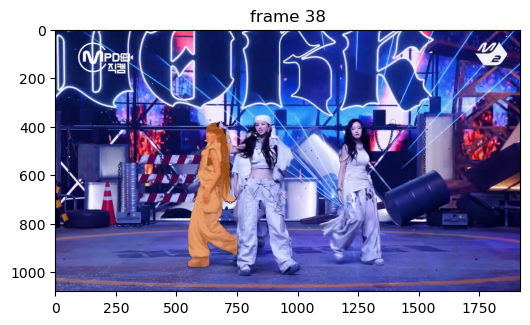

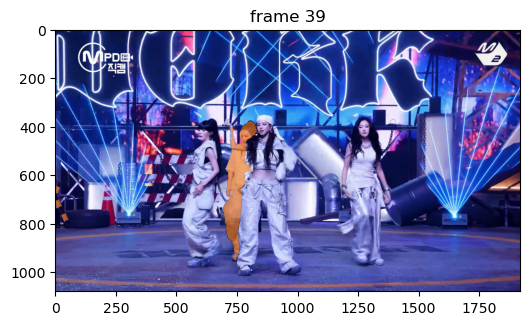

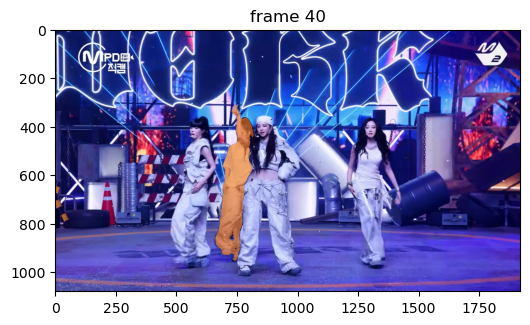

In [178]:
for out_frame_idx in range(38, 41):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.fromarray(frames[out_frame_idx]))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

- 프레임이 넘어가며 순간적으로 원래 대상의 위치에 새로운 대상이 나타나서 마스크가 옮겨간 것을 아닌가 싶어서 1프레임 단위로 확인했으나 그건 아닌 것 같다.
    - 원래 대상의 위치가 x좌표 약 600지점에 거의 이동하지 않은 상태였으나 x좌표 약 750지점에 새로 나타난 대상에게 마스크가 옮겨졌다.
- 마스크가 옮겨간 대상이 같은 원래 대상과 같은 헤어스타일이긴 하지만 반팔과 민소매라는 차이도 있는데 왜 그런지 이유는 알 수 없으나 모델이 순간적으로 새로운 대상이 더 이전과 유사하다고 판단한 것 같다.
- 이후 프레임에서는 다시 원래 대상으로 돌아가지 않고 새로운 대상에게 마스크가 유지되었다.
    - SAM2에서는 메모리 인코더를 통해 대상의 특징을 기억한다고 하지만 직전 프레임에 더 의존하는 경향을 보이는 것으로 추측된다.

- 마스크가 옮겨갔던 두 대상의 특징을 모두 익히면 더 잘 구분할까?

In [187]:
clicked_points = []
prompts = {} 
image = frames[0]
click_points(image)

클릭된 좌표: (1092, 516)
클릭된 좌표: (1144, 553)
클릭된 좌표: (1029, 573)
클릭된 좌표: (1099, 596)
클릭된 좌표: (1111, 693)
클릭된 좌표: (1067, 781)
클릭된 좌표: (1190, 883)
클릭된 좌표: (1037, 903)
모든 클릭된 좌표: [(1092, 516), (1144, 553), (1029, 573), (1099, 596), (1111, 693), (1067, 781), (1190, 883), (1037, 903)]


In [189]:
ann_frame_idx = 0
ann_obj_id = 1 

points = np.array(clicked_points, dtype=np.float32)
labels = np.array([1]*len(points), np.int32)
prompts[ann_obj_id] = points, labels

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

In [190]:
clicked_points = []
image = frames[0]
click_points(image)

ann_obj_id = 2

points = np.array(clicked_points, dtype=np.float32)
labels = np.array([1]*len(points), np.int32)
prompts[ann_obj_id] = points, labels

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

클릭된 좌표: (993, 499)
클릭된 좌표: (936, 558)
클릭된 좌표: (990, 611)
클릭된 좌표: (1001, 724)
클릭된 좌표: (945, 763)
클릭된 좌표: (912, 869)
클릭된 좌표: (1013, 799)
클릭된 좌표: (1017, 533)
모든 클릭된 좌표: [(993, 499), (936, 558), (990, 611), (1001, 724), (945, 763), (912, 869), (1013, 799), (1017, 533)]


In [193]:
clicked_points = []
image = frames[0]
click_points(image)

ann_obj_id = 3

points = np.array(clicked_points, dtype=np.float32)
labels = np.array([1]*len(points), np.int32)
prompts[ann_obj_id] = points, labels

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

클릭된 좌표: (728, 505)
클릭된 좌표: (627, 577)
클릭된 좌표: (699, 597)
클릭된 좌표: (833, 549)
클릭된 좌표: (736, 683)
클릭된 좌표: (685, 806)
클릭된 좌표: (669, 928)
클릭된 좌표: (794, 838)
모든 클릭된 좌표: [(728, 505), (627, 577), (699, 597), (833, 549), (736, 683), (685, 806), (669, 928), (794, 838)]


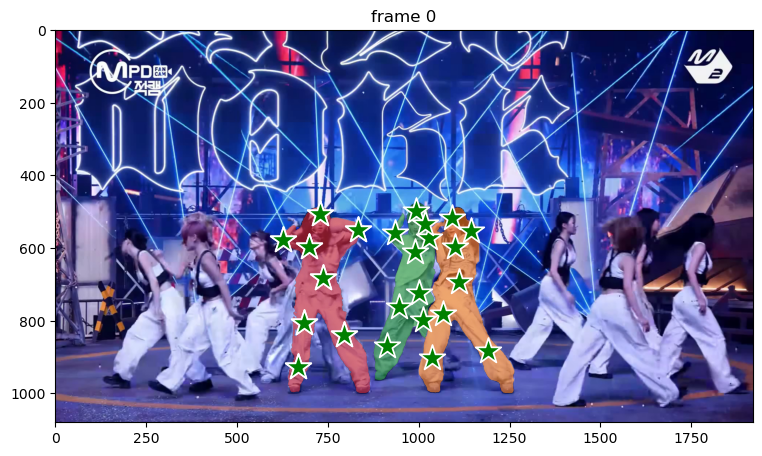

In [194]:
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.fromarray(frames[ann_frame_idx]))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

- 혹시 몰라서 3명까지 별도로 프롬프트에 입력하여 특징을 구분하도록 유도해봤다.

In [195]:
# 영상 전체에 순전파를 통한 마스크 생성
video_segments = {}  # 프레임별 segmentation 결과
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 50/50 [03:05<00:00,  3.71s/it]


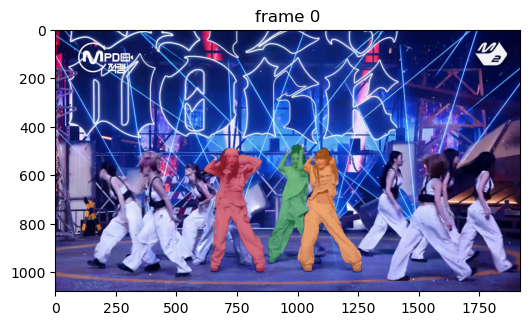

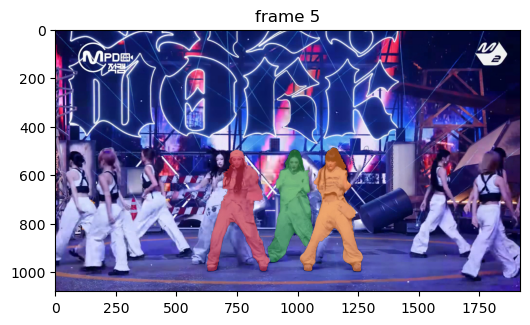

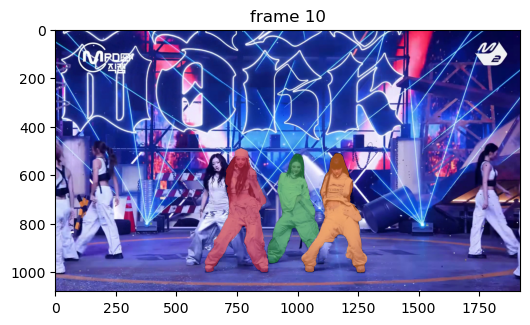

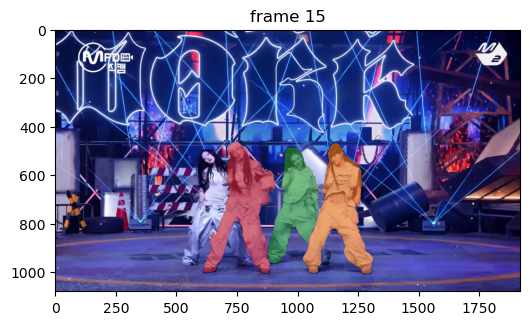

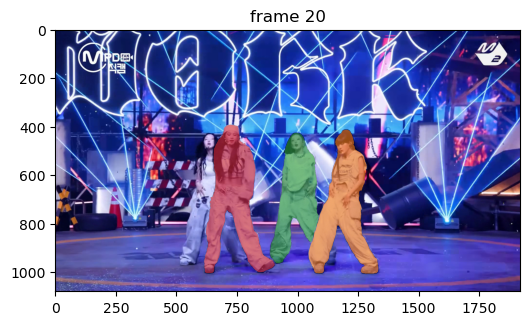

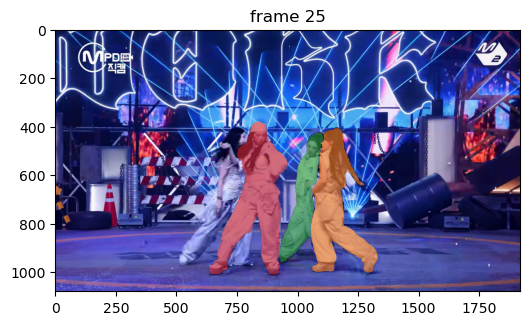

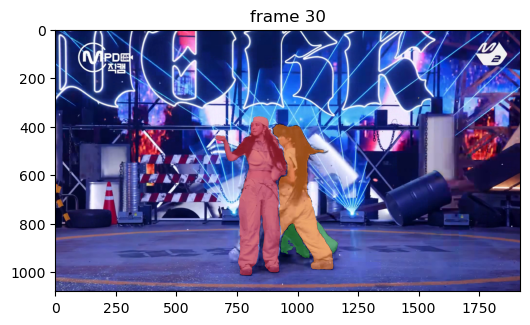

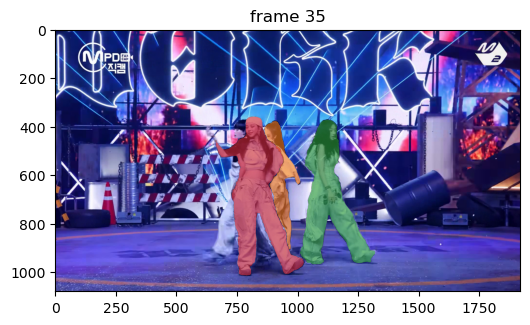

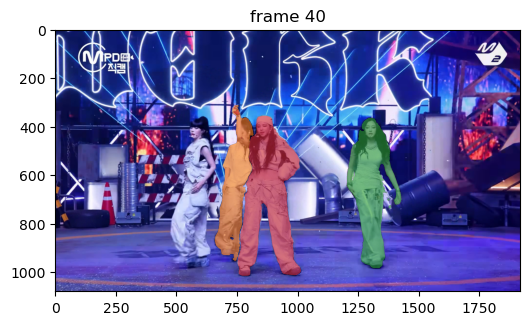

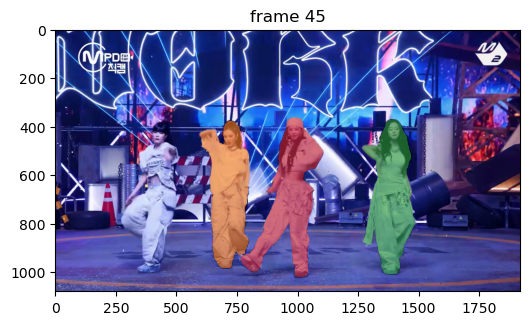

In [196]:
vis_frame_stride = 5
plt.close("all")
for out_frame_idx in range(0, len(frames), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.fromarray(frames[out_frame_idx]))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

- 그래도 겹쳐졌다가 흩어지는 대상은 제대로 구분해내지 못한다는 단점이 확인되었다.

# 회고

- 데모 사이트에서 처럼 GUI를 구현하려 했으나 GEMINI CLI를 통한 바이브 코딩도 어느 정도 프론트엔드(?)에 관한 지식이 있어야 세부적인 계획을 통해 만들 수 있다는 점을 깨달았다.

- 마우스 클릭을 통한 위치 좌표 입력을 구현하여 좀 더 실용성을 높일 수 있었다.
    - 노트북 파일에서 이미지를 출력해보며 그리드를 기준으로 대략적인 위치 좌표를 숫자로 입력하는 방식의 실습이 다소 불편했다.
    - 정확한 위치를 입력하기 어려운 면이 있었으나 실제 이미지 위에 마우스 포인터로 클릭하여 보다 정확한 위치 입력이 가능해졌다.

- SAM2 모델의 장단점을 실습을 통해 확인할 수 있었다.
    - 이를 통해 실제 모델을 어떻게 활용하면 좋을지, 특정 작업에서 활용하기 어려운 한계점은 무엇인지 파악할 수 있었다.

- 이번 실습을 통해 추후 프로젝트에 적용 시 시행착오를 줄일 수 있는 경험을 할 수 있었다.

---